In [ ]:
!pip install diffusers transformers fastcore

In [ ]:
from PIL import Image
from fastcore.all import concat
import torch, logging
from pathlib import Path
from huggingface_hub import notebook_login
from diffusers import StableDiffusionPipeline
from PIL import Image
import matplotlib.pyplot as plt
logging.disable(logging.WARNING)

torch.manual_seed(1)
if not (Path.home()/'.huggingface'/'token').exists(): notebook_login()

In [ ]:
pipe = StableDiffusionPipeline.from_pretrained("CompVis/stable-diffusion-v1-4", revision="fp16", torch_dtype=torch.float16).to("cuda")

In [4]:
prompt = "a photograph of an astronaut on a skateboard"

  0%|          | 0/51 [00:00<?, ?it/s]

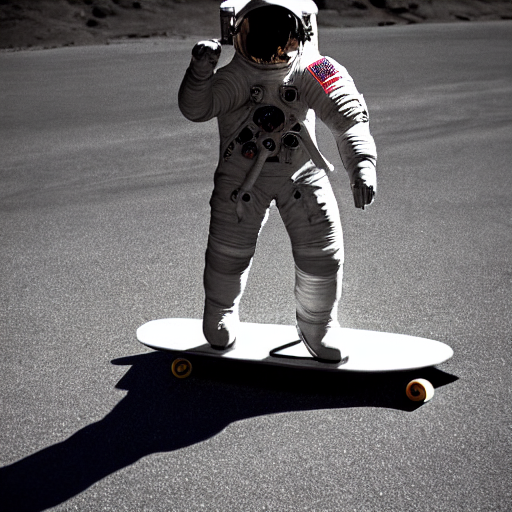

In [5]:
torch.manual_seed(123)
pipe(prompt).images[0]

  0%|          | 0/4 [00:00<?, ?it/s]

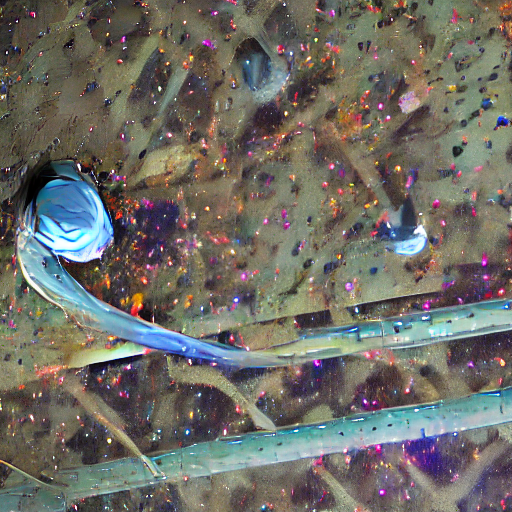

In [6]:
torch.manual_seed(123)
pipe(prompt, num_inference_steps=3).images[0]

  0%|          | 0/6 [00:00<?, ?it/s]

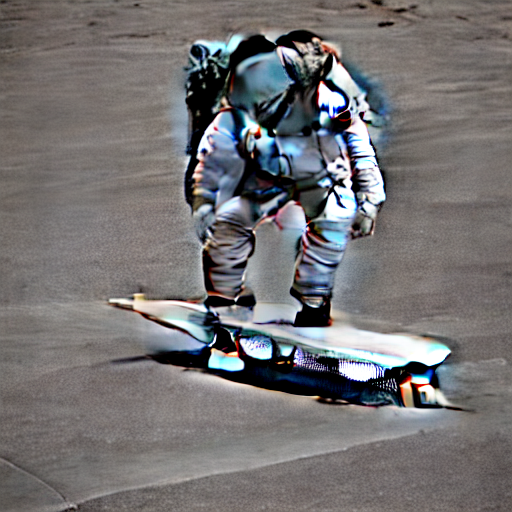

In [7]:
torch.manual_seed(123)
pipe(prompt, num_inference_steps=5).images[0]

  0%|          | 0/17 [00:00<?, ?it/s]

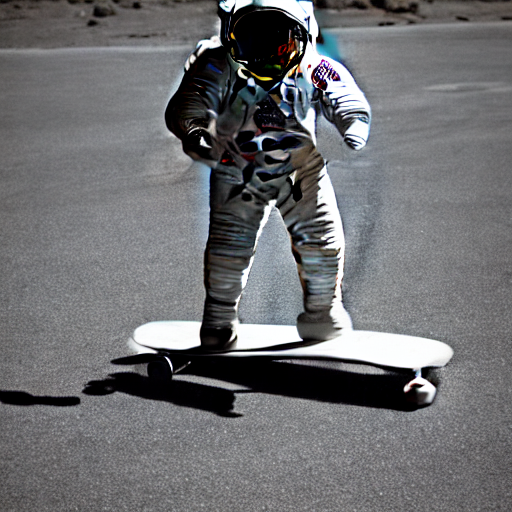

In [8]:
torch.manual_seed(123)
pipe(prompt, num_inference_steps=16).images[0]

In [9]:
def image_grid(imgs, rows, cols):
    w,h = imgs[0].size
    grid = Image.new('RGB', size=(cols*w, rows*h))
    for i, img in enumerate(imgs): grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

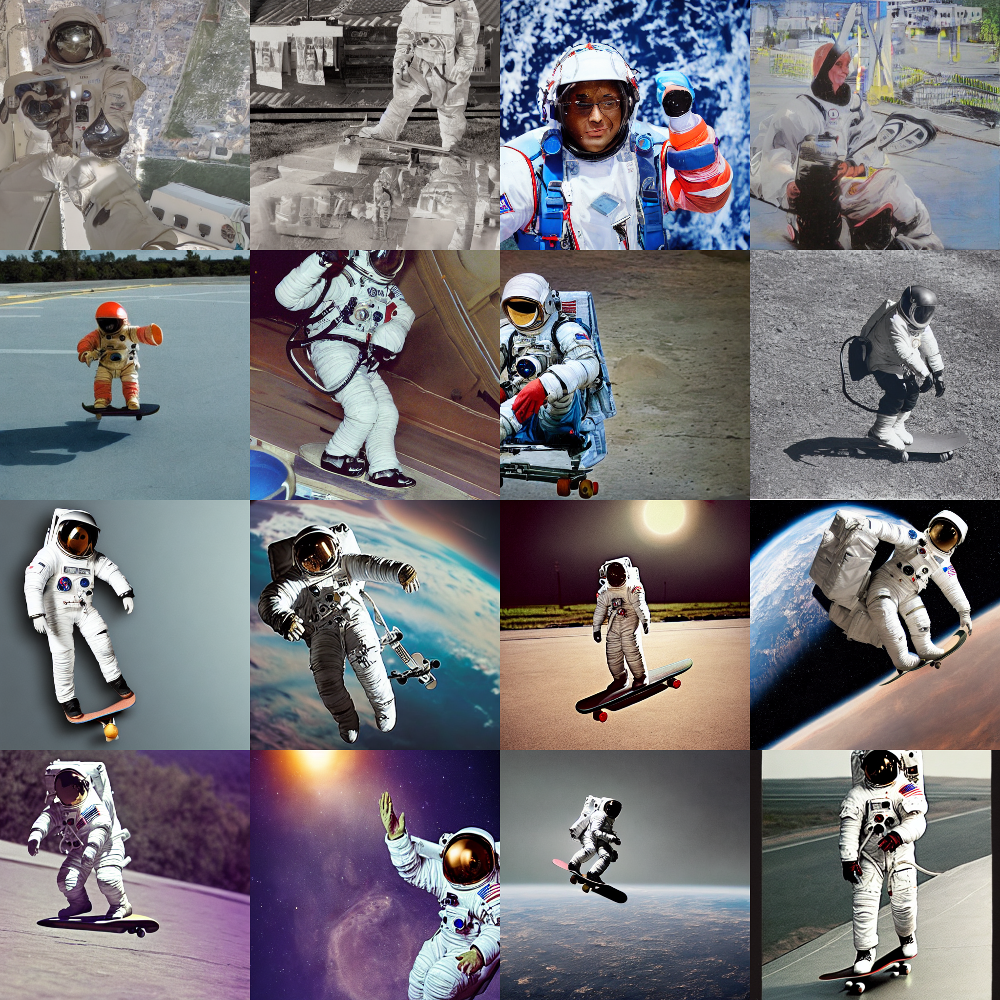

In [10]:
num_rows, num_cols = 4, 4
prompts = [prompt] * num_cols
images = concat(pipe(prompts, guidance_scale=g).images for g in [1, 3, 7, 10, 14])
image_grid(images, rows=num_rows, cols=num_cols)

  0%|          | 0/51 [00:00<?, ?it/s]

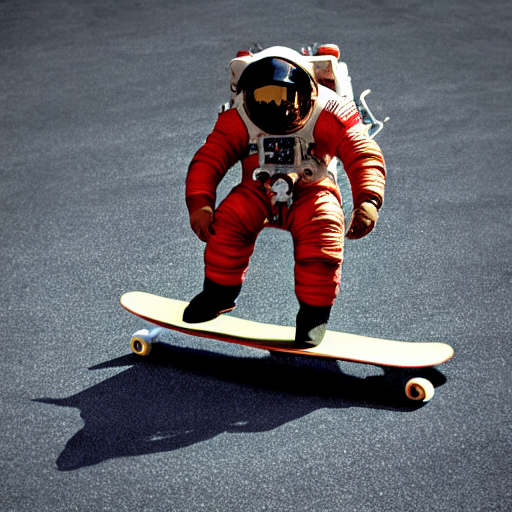

In [11]:
torch.manual_seed(123)
pipe(prompt, negative_prompt="white").images[0]

In [ ]:
from diffusers import StableDiffusionImg2ImgPipeline
from fastdownload import FastDownload

pipei2i = StableDiffusionImg2ImgPipeline.from_pretrained(
    "CompVis/stable-diffusion-v1-4", 
    revision="fp16", 
    torch_dtype=torch.float16
    ).to("cuda")

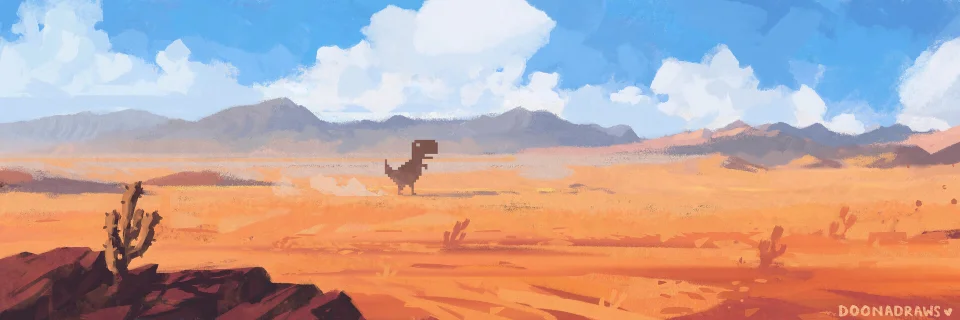

In [13]:
p = FastDownload().download("https://preview.redd.it/gp3lynz4vdl61.jpg?width=960&crop=smart&auto=webp&s=1f53a77ee7bcc8b929e89c8c3259fd410682e67e")
init_image = Image.open(p).convert("RGB")
init_image

  0%|          | 0/41 [00:00<?, ?it/s]

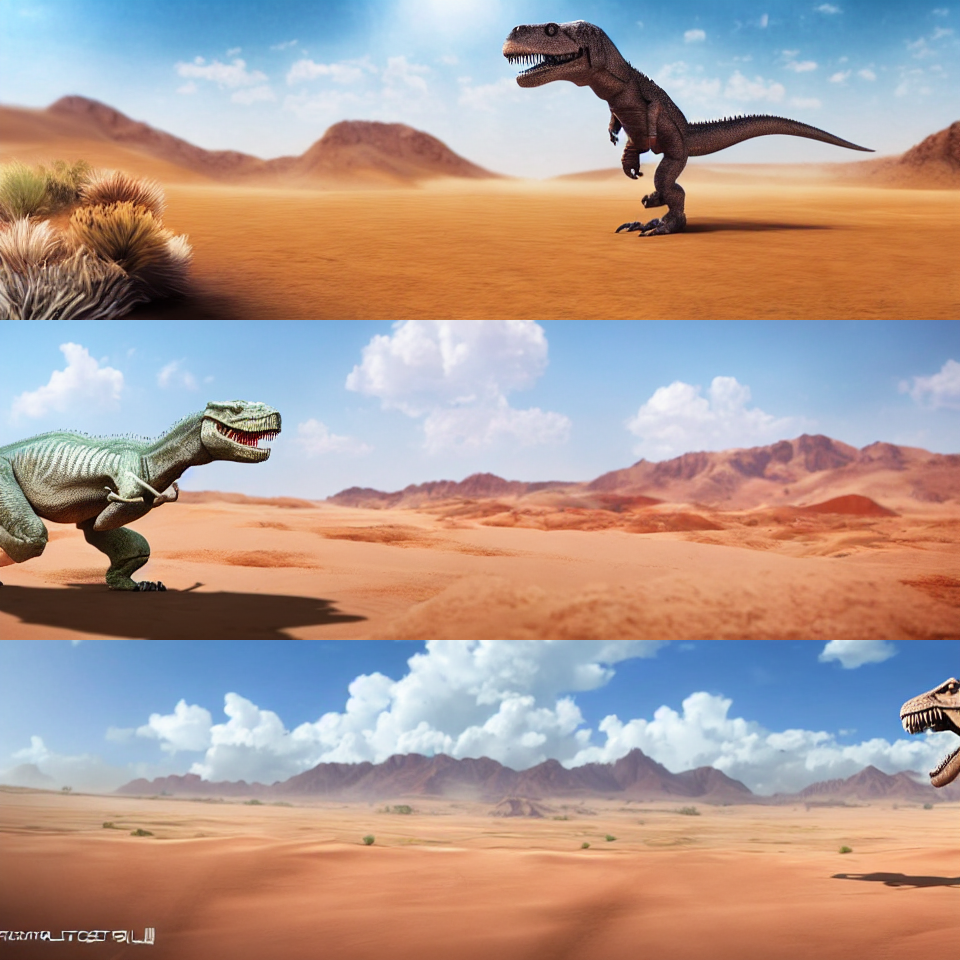

In [14]:
torch.manual_seed(100)
prompt = "T-Rex in a desert, photorealistic 4K"
images = pipei2i(
    prompt=prompt,
    num_images_per_prompt=3,
    init_image=init_image,
    strength=0.8,
    num_inference_steps=50
).images
image_grid(images, rows=3, cols=1)

  0%|          | 0/41 [00:00<?, ?it/s]

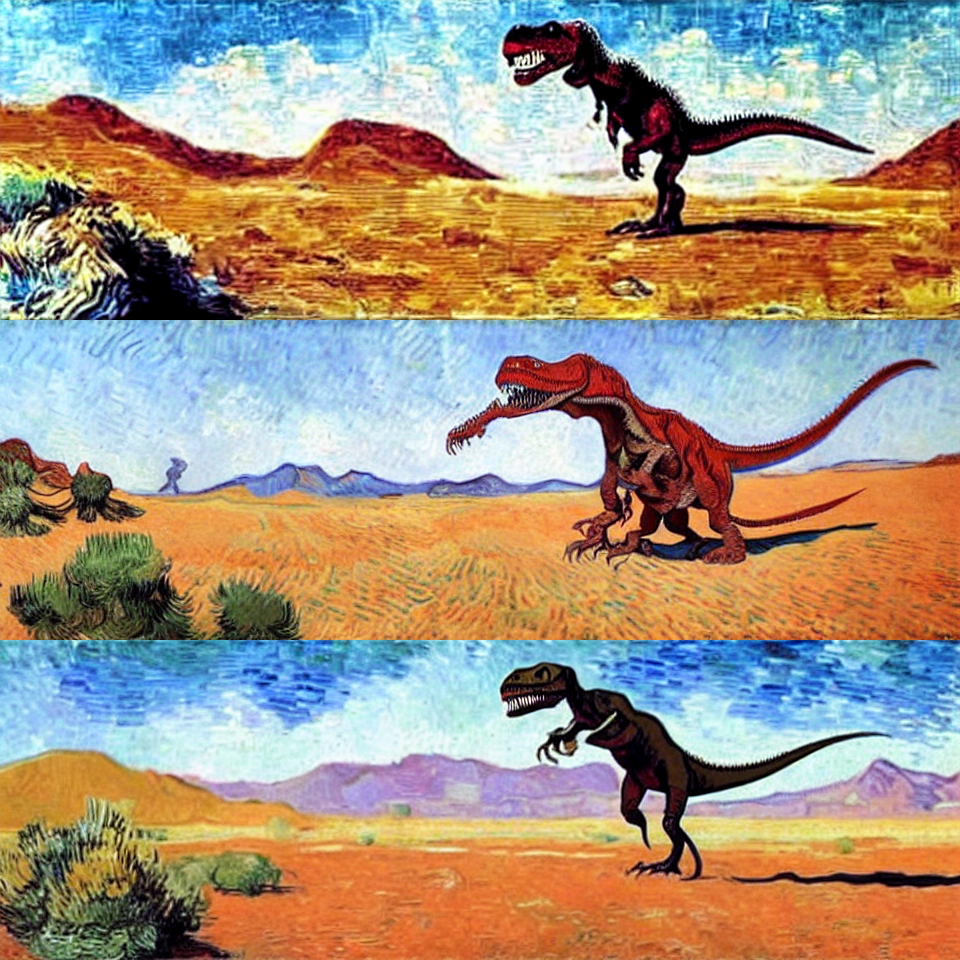

In [15]:
torch.manual_seed(100)
init_image = images[0]
prompt = "Oil painting of a T-Rex in desert by Van Gogh"
images = pipei2i(
    prompt=prompt,
    num_images_per_prompt=3,
    init_image=init_image,
    strength=0.8,
    num_inference_steps=50
).images
image_grid(images, rows=3, cols=1)